[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/lifeng6666666/freeLearnLab/blob/main/reinforcement-learning/ch09_ppo.ipynb)


In [ ]:
# Colab 环境准备：安装依赖并获取 viz_utils.py（本地 Jupyter 运行可跳过本格）
import os
if "google.colab" in str(get_ipython()):
    !pip install -q gymnasium
    if not os.path.exists('viz_utils.py'):
        !wget -q https://raw.githubusercontent.com/lifeng6666666/freeLearnLab/main/reinforcement-learning/viz_utils.py


# Ch09 - PPO 工业级强化学习算法

Proximal Policy Optimization：clipped surrogate + multi-epoch 更新。

> 本 Notebook 配套《强化学习全面教程》PDF 使用。

In [4]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import gymnasium as gym
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import random
from collections import deque, defaultdict

# 中文字体配置
import os, platform
if platform.system() == 'Linux' and os.path.exists('/usr/share/fonts/truetype/chinese/NotoSansSC-Regular.ttf'):
    fm.fontManager.addfont('/usr/share/fonts/truetype/chinese/NotoSansSC-Regular.ttf')
plt.rcParams['font.sans-serif'] = ['Noto Sans SC', 'DejaVu Sans', 'Arial Unicode MS']
plt.rcParams['axes.unicode_minus'] = False

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'PyTorch: {torch.__version__} | 设备: {device} | Gymnasium: {gym.__version__}')


PyTorch: 2.13.0+cpu | 设备: cpu | Gymnasium: 1.3.0


## 9.1 PPO-Clip 损失函数

用重要性采样比 $r_t(\theta) = \pi_\theta(a_t|s_t) / \pi_{\theta_{old}}(a_t|s_t)$ 衡量新旧策略差异，在 r 上裁剪：

$$L^{CLIP}(\theta) = E[\min(r_t A_t, \text{clip}(r_t, 1-\epsilon, 1+\epsilon) A_t)]$$

其中 ε 通常取 0.2。

## 9.2 PPO 总损失

$$L^{PPO} = L^{CLIP} - c_1 L^{VF} + c_2 S[\pi_\theta]$$

- $L^{VF}$：价值损失（也常加裁剪）
- $S[\pi_\theta]$：策略熵，鼓励探索
- $c_1 = 0.5, c_2 = 0.01$ 是经验值

## 9.3 PPO 训练流程

1. 用 $\pi_{\theta_{old}}$ 收集一批数据（2048 步）
2. 计算 GAE 优势与回报
3. **在同一批数据上做多次 epoch 更新**（4 epochs）
4. 每个 epoch 内分 mini-batch（64 样本）更新
5. 更新后 $\pi_{\theta_{old}} \leftarrow \pi_\theta$

**关键差异**：A2C 每批数据只用一次，PPO 重复利用多次（裁剪机制保证不偏离太远）。

In [5]:
class PolicyNetwork(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim, hidden), nn.Tanh(),
            nn.Linear(hidden, hidden), nn.Tanh(),
        )
        self.head = nn.Linear(hidden, action_dim)
    def forward(self, x): return self.head(self.net(x))


class ValueNetwork(nn.Module):
    def __init__(self, state_dim, hidden=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim, hidden), nn.Tanh(),
            nn.Linear(hidden, hidden), nn.Tanh(),
            nn.Linear(hidden, 1),
        )
    def forward(self, x): return self.net(x).squeeze(-1)


class PPOAgent:
    def __init__(self, state_dim, action_dim, lr=3e-4, gamma=0.99,
                 lam=0.95, clip_eps=0.2, epochs=4, batch_size=64,
                 entropy_coef=0.01, value_coef=0.5):
        self.device = device
        self.gamma = gamma
        self.lam = lam
        self.clip_eps = clip_eps
        self.epochs = epochs
        self.batch_size = batch_size
        self.entropy_coef = entropy_coef
        self.value_coef = value_coef
        self.actor = PolicyNetwork(state_dim, action_dim).to(device)
        self.critic = ValueNetwork(state_dim).to(device)
        self.optimizer = optim.Adam(
            list(self.actor.parameters()) + list(self.critic.parameters()), lr=lr)

    def select_action(self, state):
        with torch.no_grad():
            s = torch.as_tensor(state, dtype=torch.float32, device=device).unsqueeze(0)
            logits = self.actor(s)
            dist = Categorical(logits=logits)
            a = dist.sample()
            return a.item(), dist.log_prob(a).item(), self.critic(s).item()

    def compute_gae(self, rewards, values, dones, last_value):
        advantages = []
        gae = 0
        next_value = last_value
        for r, v, d in zip(reversed(rewards), reversed(values), reversed(dones)):
            delta = r + self.gamma * next_value * (1 - d) - v
            gae = delta + self.gamma * self.lam * (1 - d) * gae
            advantages.insert(0, gae)
            next_value = v
        return advantages

    def update(self, states, actions, old_log_probs, returns, advantages):
        s = torch.as_tensor(np.array(states), dtype=torch.float32, device=device)
        a = torch.as_tensor(actions, dtype=torch.long, device=device)
        old_lp = torch.as_tensor(old_log_probs, dtype=torch.float32, device=device)
        ret = torch.as_tensor(returns, dtype=torch.float32, device=device)
        adv = torch.as_tensor(advantages, dtype=torch.float32, device=device)
        if adv.numel() > 1:
            adv = (adv - adv.mean()) / (adv.std() + 1e-8)

        n = len(states)
        for _ in range(self.epochs):
            idx = np.random.permutation(n)
            for start in range(0, n, self.batch_size):
                end = start + self.batch_size
                mb = idx[start:end]
                logits = self.actor(s[mb])
                dist = Categorical(logits=logits)
                new_lp = dist.log_prob(a[mb])
                entropy = dist.entropy().mean()
                v = self.critic(s[mb])
                ratio = (new_lp - old_lp[mb]).exp()
                surr1 = ratio * adv[mb]
                surr2 = torch.clamp(ratio, 1 - self.clip_eps, 1 + self.clip_eps) * adv[mb]
                actor_loss = -torch.min(surr1, surr2).mean()
                v_clipped = ret[mb] + torch.clamp(v - ret[mb], -self.clip_eps, self.clip_eps)
                value_loss = torch.max((v - ret[mb]) ** 2, (v_clipped - ret[mb]) ** 2).mean()
                total = actor_loss + self.value_coef * value_loss - self.entropy_coef * entropy
                self.optimizer.zero_grad()
                total.backward()
                nn.utils.clip_grad_norm_(self.actor.parameters(), 5.0)
                nn.utils.clip_grad_norm_(self.critic.parameters(), 5.0)
                self.optimizer.step()

env = gym.make('CartPole-v1')
agent = PPOAgent(env.observation_space.shape[0], env.action_space.n)
print('PPO Agent 创建完成 ✓')

PPO Agent 创建完成 ✓


## 9.4 PPO 训练循环

收集 2048 步数据 → 计算 GAE → 多 epoch 更新。

In [6]:
from torch.distributions import Categorical
random.seed(42); np.random.seed(42); torch.manual_seed(42)

iterations = 100  # 可调高到 200 获得更稳定结果
steps_per_iter = 2048
rewards_log = []
ep_count = 0

for it in range(iterations):
    states, actions, log_probs, rewards, values, dones = [], [], [], [], [], []
    s, _ = env.reset(seed=42 + it)
    ep_reward = 0
    ep_rewards = []

    for t in range(steps_per_iter):
        a, lp, v = agent.select_action(s)
        s_next, r, terminated, truncated, _ = env.step(a)
        done = terminated or truncated
        states.append(s); actions.append(a); log_probs.append(lp)
        rewards.append(r); values.append(v); dones.append(done)
        s = s_next
        ep_reward += r
        if done:
            ep_rewards.append(ep_reward)
            ep_count += 1
            s, _ = env.reset(seed=42 + ep_count)
            ep_reward = 0
        if t == steps_per_iter - 1: break

    with torch.no_grad():
        last_v = agent.critic(torch.as_tensor(s, dtype=torch.float32, device=device).unsqueeze(0)).item()
    advantages = agent.compute_gae(rewards, values, dones, last_v)
    returns = [a + v for a, v in zip(advantages, values)]
    agent.update(states, actions, log_probs, returns, advantages)

    if ep_rewards:
        rewards_log.extend(ep_rewards)
    if (it + 1) % 10 == 0 and rewards_log:
        print(f'iter {it+1:3d} | 最近10回合 avg={np.mean(rewards_log[-10:]):5.1f} | 共 {ep_count} 回合')

iter  10 | 最近10回合 avg=253.5 | 共 323 回合
iter  20 | 最近10回合 avg=366.6 | 共 376 回合
iter  30 | 最近10回合 avg=500.0 | 共 418 回合
iter  40 | 最近10回合 avg=484.7 | 共 459 回合
iter  50 | 最近10回合 avg=476.7 | 共 499 回合
iter  60 | 最近10回合 avg=500.0 | 共 539 回合
iter  70 | 最近10回合 avg=493.5 | 共 579 回合
iter  80 | 最近10回合 avg=467.4 | 共 619 回合
iter  90 | 最近10回合 avg=397.7 | 共 660 回合
iter 100 | 最近10回合 avg=492.0 | 共 700 回合


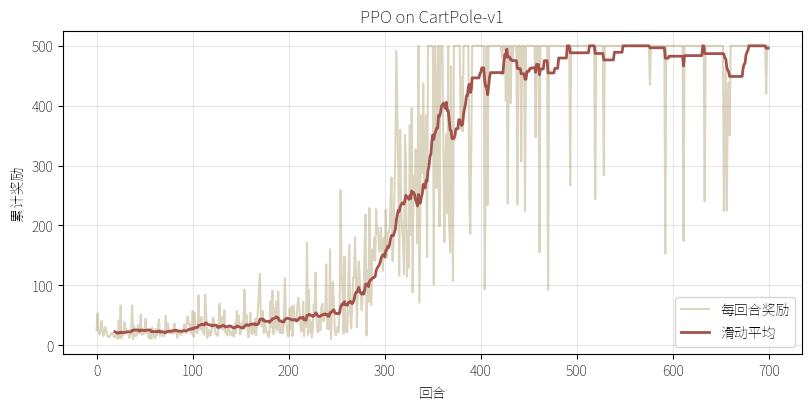

In [7]:
fig, ax = plt.subplots(figsize=(8, 4), constrained_layout=True)
ax.plot(rewards_log, alpha=0.3, color='#887129', label='每回合奖励')
if len(rewards_log) >= 20:
    ma = np.convolve(rewards_log, np.ones(20)/20, mode='valid')
    ax.plot(range(19, len(rewards_log)), ma, color='#a2524b', linewidth=2, label='滑动平均')
ax.set_xlabel('回合'); ax.set_ylabel('累计奖励')
ax.set_title('PPO on CartPole-v1')
ax.legend(loc='lower right'); ax.grid(alpha=0.3)
plt.show()

## 9.5 可视化训练效果

用训练好的策略跑一回合 CartPole，动画展示小车平衡杆的控制效果。

In [8]:
from viz_utils import visualize_cartpole

def _policy_fn(s):
    with torch.no_grad():
        s_t = torch.as_tensor(s, dtype=torch.float32, device=device).unsqueeze(0)
        return int(agent.actor(s_t).argmax(dim=1).item())

visualize_cartpole(_policy_fn, title='PPO 策略可视化')

## 9.6 小结

PPO 是当前 RL 工业标准：
- 训练稳定（clipped surrogate 限制策略变化）
- 样本效率高于 A2C（multi-epoch 重用数据）
- 易于实现（比 TRPO 简单）

**应用场景**：OpenAI Five、ChatGPT 的 RLHF 阶段都用 PPO。

下一章：**SAC**——连续控制任务上的 SOTA 算法。